#Imports.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.ensemble import RandomForestClassifier

#CSV Upload.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# NOTE: this path may not work for everyone as it's how my drive is set up so I'd use the commented out section below, and comment this out!
df = pd.read_csv('/content/drive/MyDrive/Computer Science/TechWise/Course #2: Foundations of AIML/Project/Impact_of_Remote_Work_on_Mental_Health.csv')

# Use this commented out section instead.
#df = pd.read_csv('/content/drive/MyDrive/Impact_of_Remote_Work_on_Mental_Health.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Employee_ID                        5000 non-null   object
 1   Age                                5000 non-null   int64 
 2   Gender                             5000 non-null   object
 3   Job_Role                           5000 non-null   object
 4   Industry                           5000 non-null   object
 5   Years_of_Experience                5000 non-null   int64 
 6   Work_Location                      5000 non-null   object
 7   Hours_Worked_Per_Week              5000 non-null   int64 
 8   Number_of_Virtual_Meetings         5000 non-null   int64 
 9   Work_Life_Balance_Rating           5000 non-null   int64 
 10  Stress_Level                       5000 non-null   object
 11  Mental_Health_Condition            3804 non-null   object
 12  Access

In [5]:
# Dropping missing values
df.dropna(inplace=True)

# Checking there is no null/missing values
df.isnull().sum()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2577 entries, 0 to 4997
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Employee_ID                        2577 non-null   object
 1   Age                                2577 non-null   int64 
 2   Gender                             2577 non-null   object
 3   Job_Role                           2577 non-null   object
 4   Industry                           2577 non-null   object
 5   Years_of_Experience                2577 non-null   int64 
 6   Work_Location                      2577 non-null   object
 7   Hours_Worked_Per_Week              2577 non-null   int64 
 8   Number_of_Virtual_Meetings         2577 non-null   int64 
 9   Work_Life_Balance_Rating           2577 non-null   int64 
 10  Stress_Level                       2577 non-null   object
 11  Mental_Health_Condition            2577 non-null   object
 12  Access_to_M

#Clean Up.

In [6]:
# Splitting columns into numerical & categorical data types for encoding
numerical_cols = []
categorical_cols = []

# Dropping Employee_ID column, as it just describes each unique employee, not necessary for analysis
df_clean = df.drop(columns = 'Employee_ID')

# For loop to sort columns in dataset & split into lists for numerical and categorical
for col in df_clean.columns:
    if df_clean[col].dtype == 'object':
        categorical_cols.append(col)
    else:
        numerical_cols.append(col)

# Checking if the loop split the columns correctly
print(numerical_cols)
print(categorical_cols)

['Age', 'Years_of_Experience', 'Hours_Worked_Per_Week', 'Number_of_Virtual_Meetings', 'Work_Life_Balance_Rating', 'Social_Isolation_Rating', 'Company_Support_for_Remote_Work']
['Gender', 'Job_Role', 'Industry', 'Work_Location', 'Stress_Level', 'Mental_Health_Condition', 'Access_to_Mental_Health_Resources', 'Productivity_Change', 'Satisfaction_with_Remote_Work', 'Physical_Activity', 'Sleep_Quality', 'Region']


In [7]:
# Encoding the categorical columns to work for correlations / comparisons
df_clean_encoded = pd.get_dummies(df_clean, columns = categorical_cols, drop_first=True)

# Viewing encoded data
df_clean_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2577 entries, 0 to 4997
Data columns (total 41 columns):
 #   Column                                     Non-Null Count  Dtype
---  ------                                     --------------  -----
 0   Age                                        2577 non-null   int64
 1   Years_of_Experience                        2577 non-null   int64
 2   Hours_Worked_Per_Week                      2577 non-null   int64
 3   Number_of_Virtual_Meetings                 2577 non-null   int64
 4   Work_Life_Balance_Rating                   2577 non-null   int64
 5   Social_Isolation_Rating                    2577 non-null   int64
 6   Company_Support_for_Remote_Work            2577 non-null   int64
 7   Gender_Male                                2577 non-null   bool 
 8   Gender_Non-binary                          2577 non-null   bool 
 9   Gender_Prefer not to say                   2577 non-null   bool 
 10  Job_Role_Designer                          2577 non-n

# Visualizations Attempt One.

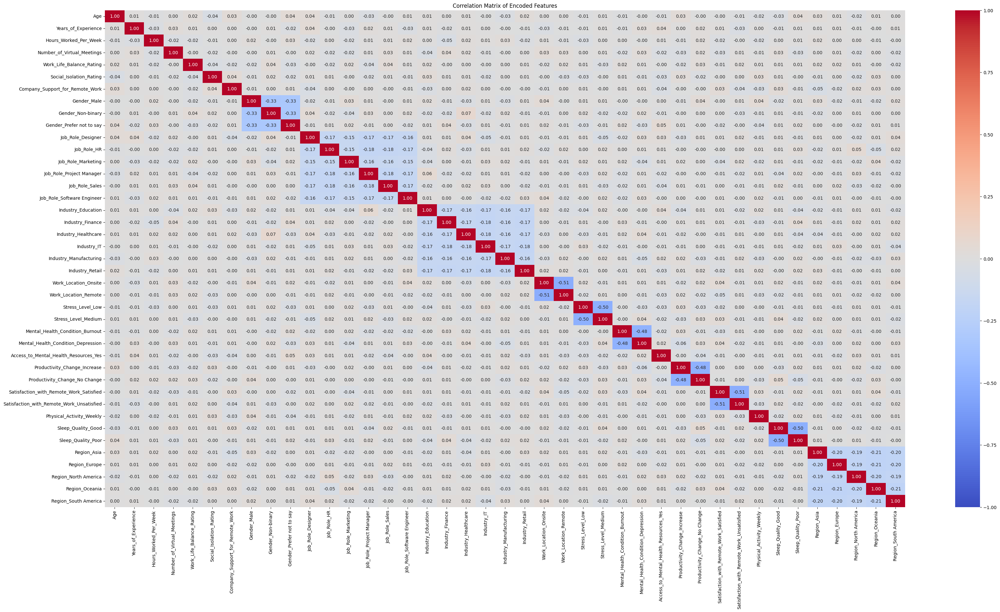

In [8]:
# Correlation Matrix:

correlation_matrix = df_clean_encoded.corr()

plt.figure(figsize=(40, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix of Encoded Features')
plt.show()

# Thoughts: Not much correlation - linearly - the correation matrix shows some relation between related variables like gender male vs female vs nonbinary & sleep quality good vs poor which is already expected
# Next: we'll try pair plots to see any non-linear relation -> the trend of scatter plots should give a better visualization of the data?


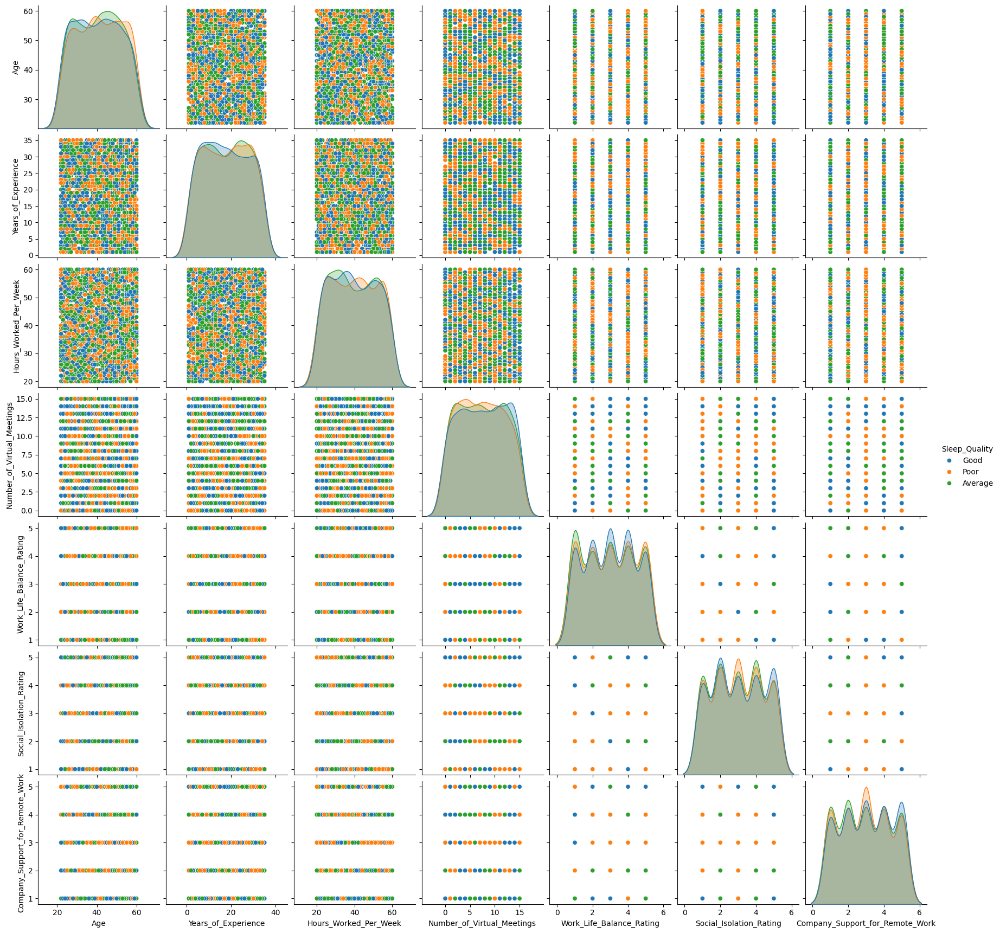

In [9]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Sleep_Quality')
plt.show()

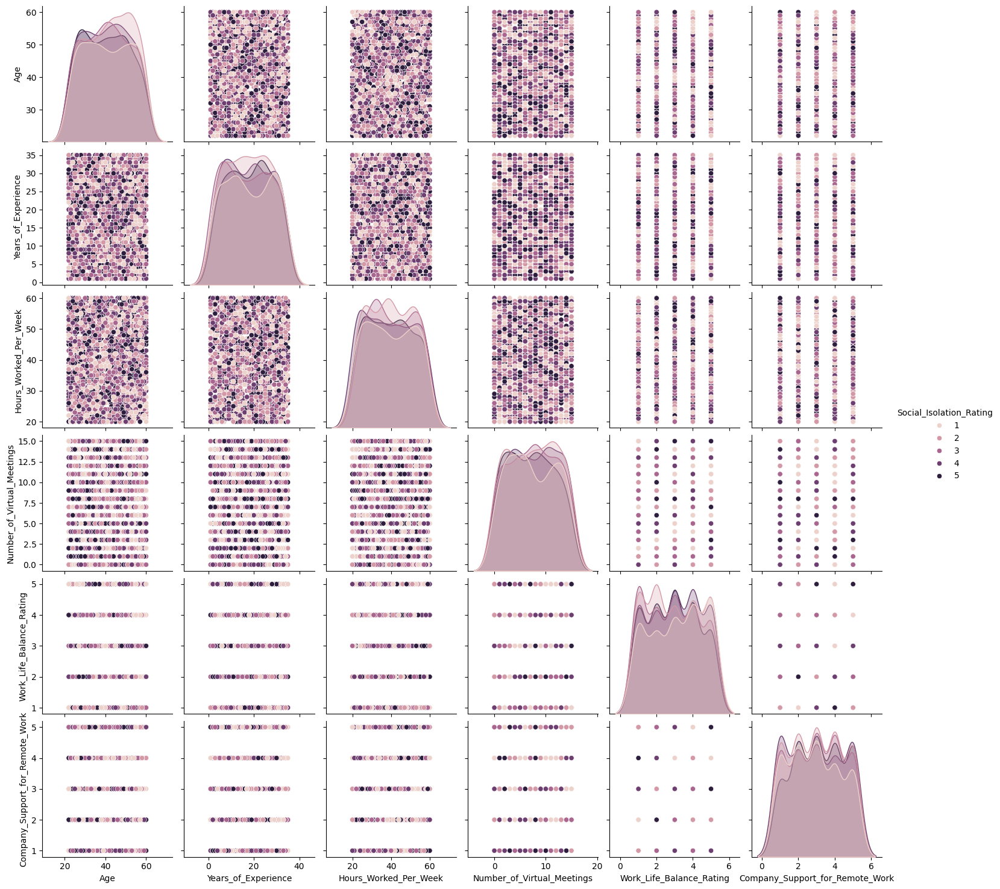

In [10]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Social_Isolation_Rating')
plt.show()

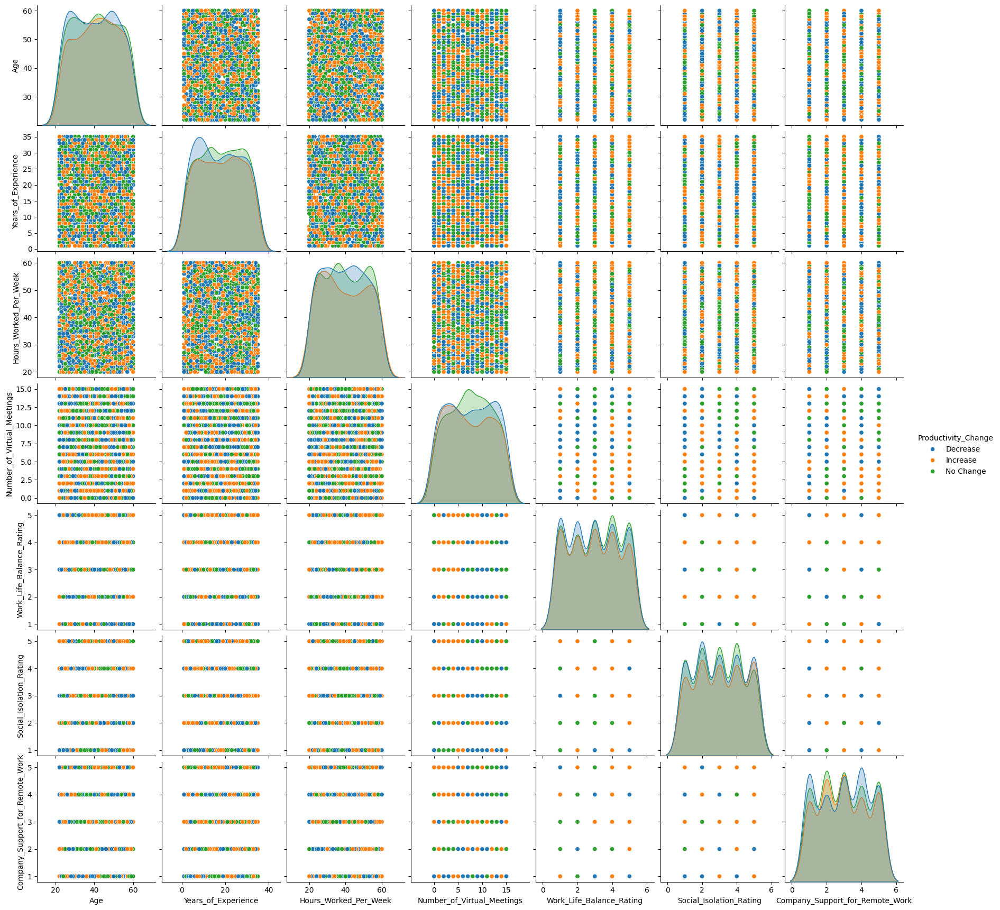

In [11]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Productivity_Change')
plt.show()

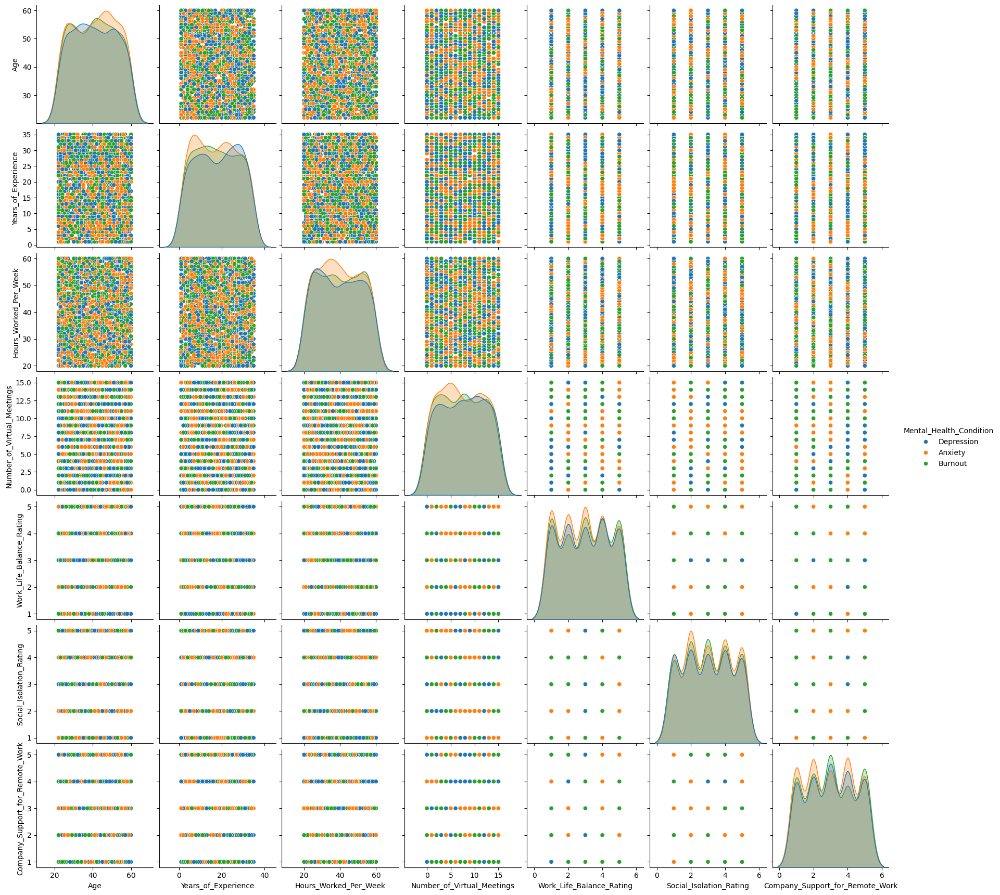

In [12]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Mental_Health_Condition')
plt.show()

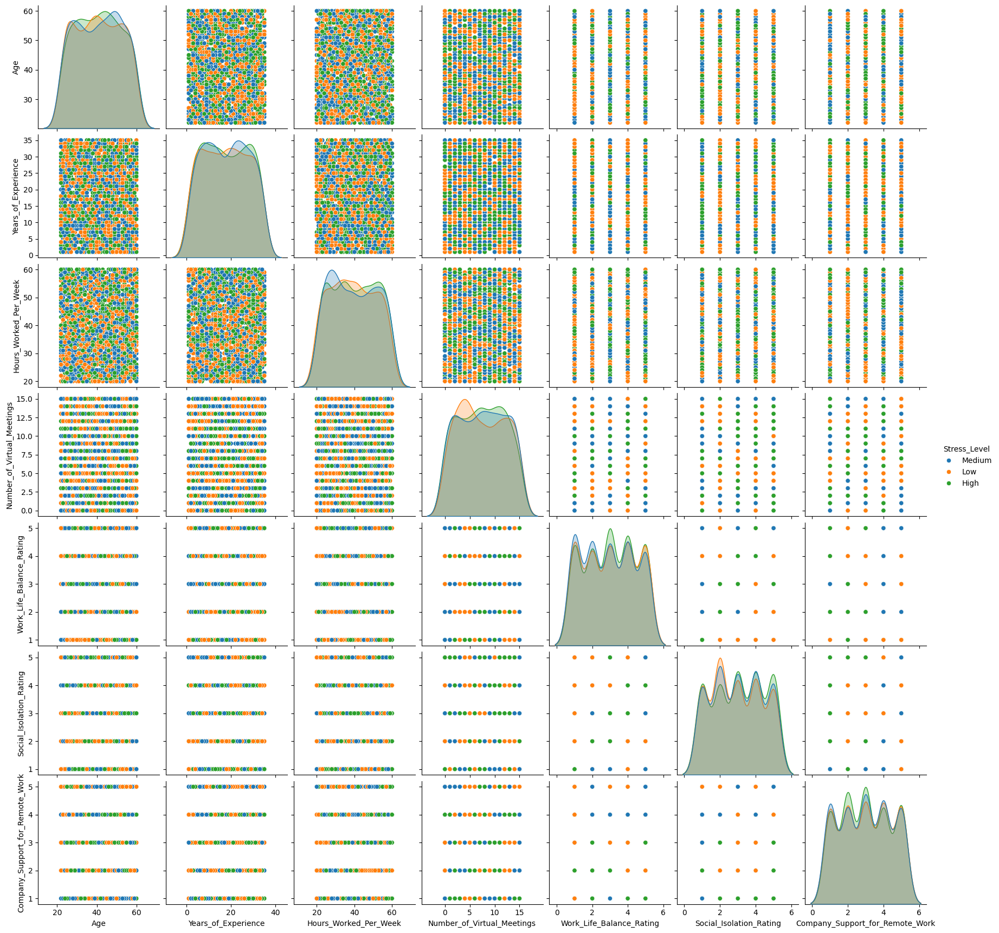

In [13]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Stress_Level')
plt.show()

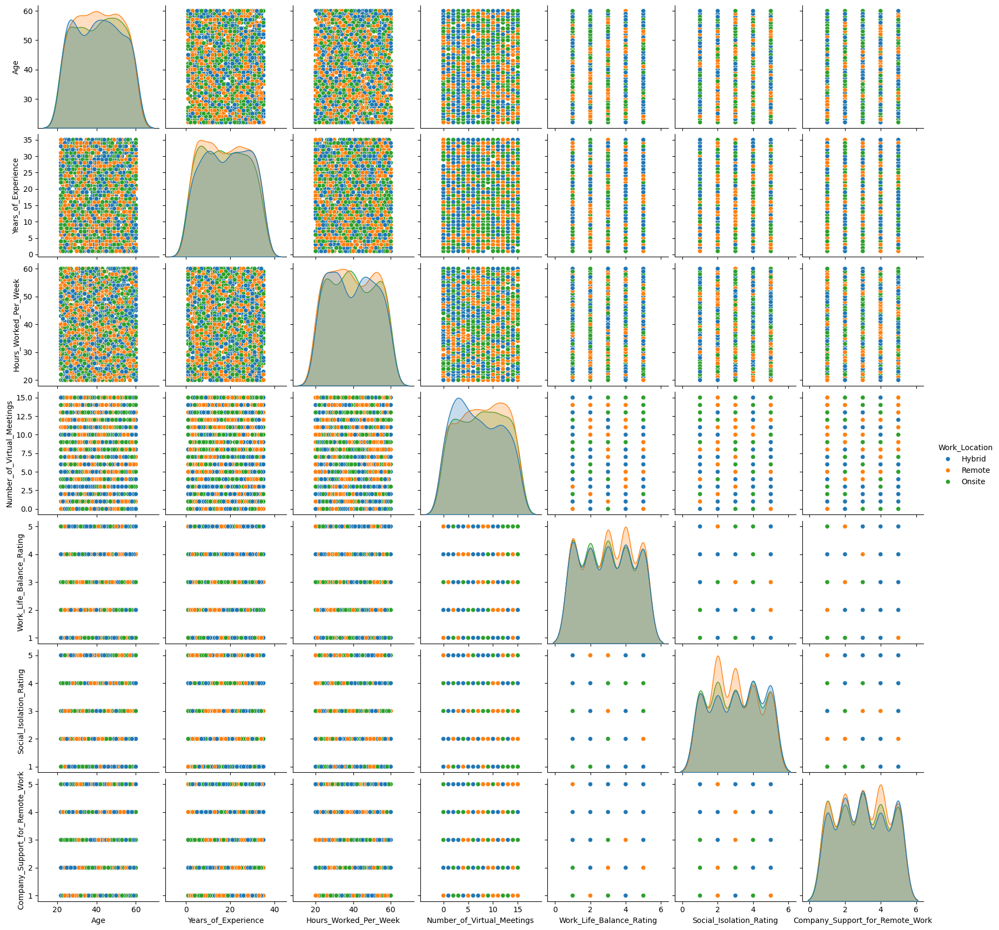

In [14]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Work_Location')
plt.show()

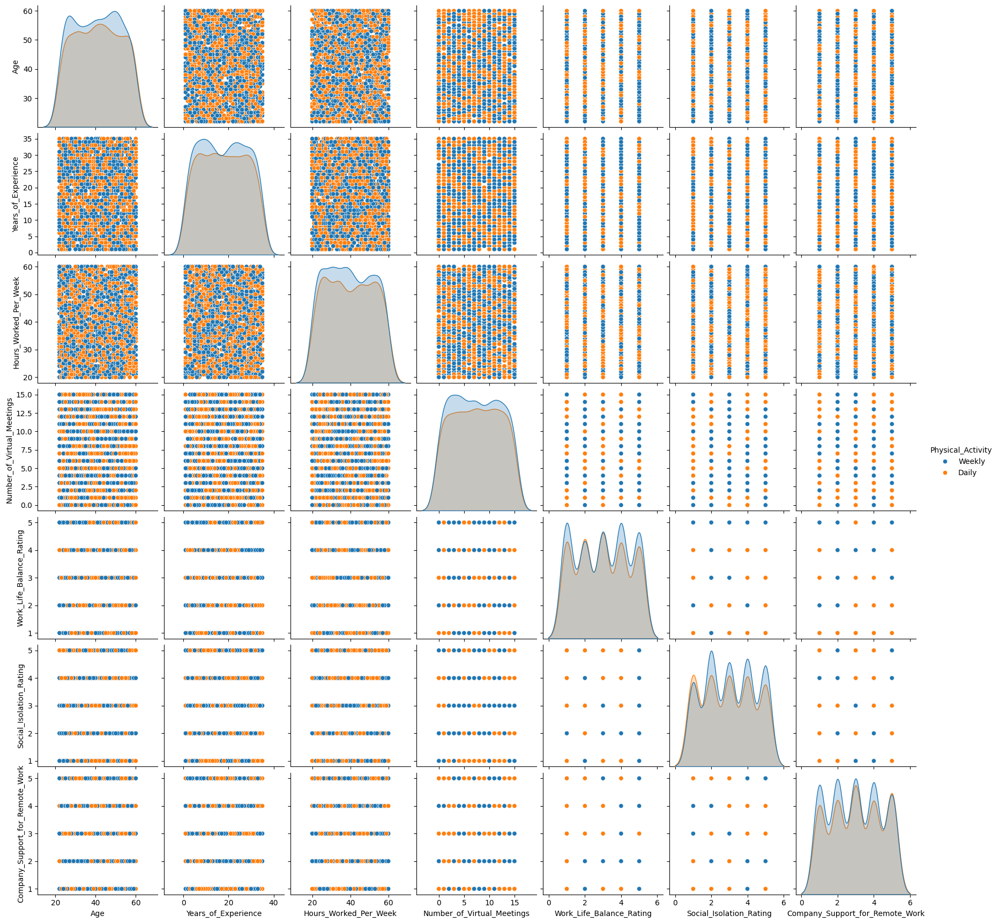

In [15]:
# Pair Plot:
sns.pairplot(df_clean, hue = 'Physical_Activity')
plt.show()

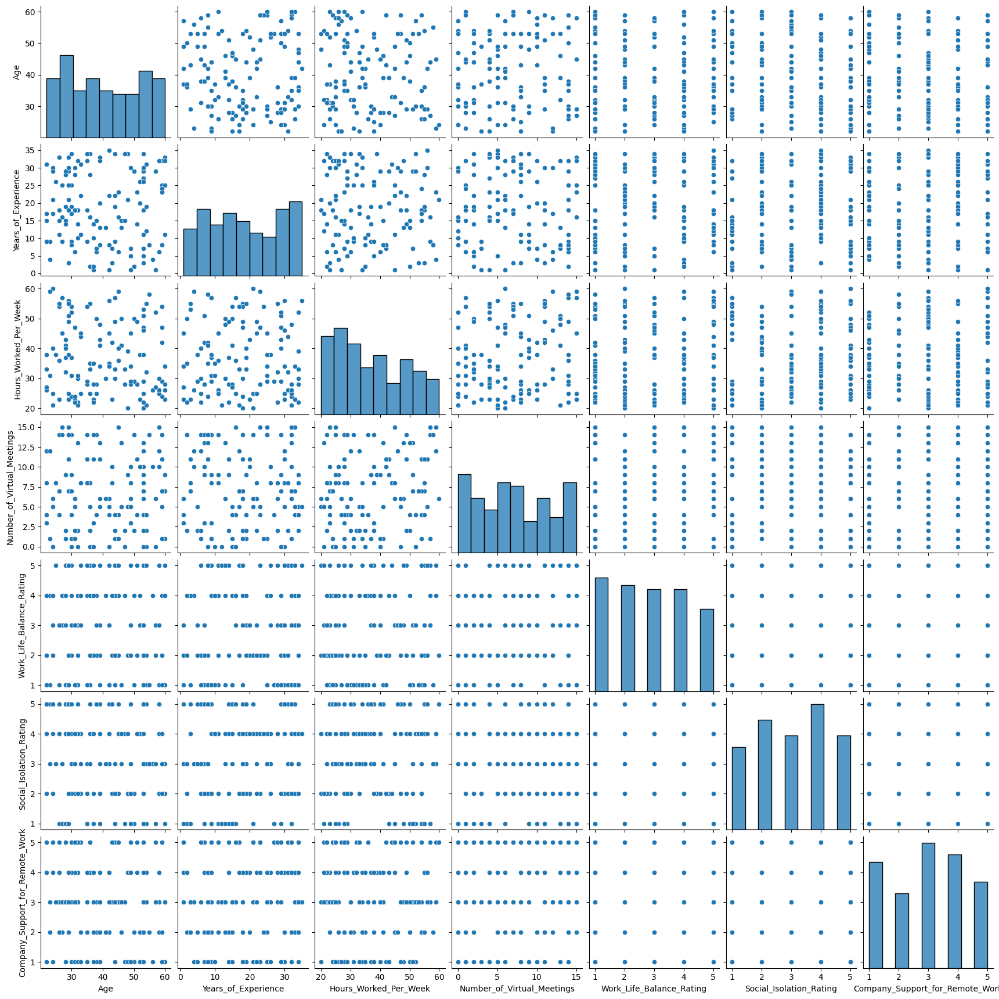

In [16]:
# Pair Plot:
sns.pairplot(df_clean.sample(frac=0.05))
plt.show()

In [17]:
from sklearn.ensemble import RandomForestClassifier

X = pd.get_dummies(df_clean_encoded.drop(columns=['Mental_Health_Condition_Burnout']), drop_first=True)
y = df_clean_encoded['Mental_Health_Condition_Burnout']

model = RandomForestClassifier()
model.fit(X, y)

feature_importance = pd.Series(model.feature_importances_, index=X.columns)
print(feature_importance.sort_values(ascending=False))

Mental_Health_Condition_Depression           0.188515
Hours_Worked_Per_Week                        0.076994
Age                                          0.076285
Years_of_Experience                          0.076102
Number_of_Virtual_Meetings                   0.063865
Social_Isolation_Rating                      0.040289
Work_Life_Balance_Rating                     0.039739
Company_Support_for_Remote_Work              0.038011
Access_to_Mental_Health_Resources_Yes        0.016194
Physical_Activity_Weekly                     0.015878
Stress_Level_Low                             0.015521
Stress_Level_Medium                          0.015053
Sleep_Quality_Poor                           0.014970
Work_Location_Remote                         0.014827
Satisfaction_with_Remote_Work_Unsatisfied    0.014778
Sleep_Quality_Good                           0.014565
Satisfaction_with_Remote_Work_Satisfied      0.014341
Productivity_Change_No Change                0.014339
Work_Location_Onsite        

In [18]:
# prompt: use random forest classifier, with target column as satisfaction with remote work and use df_clean_encoded for dataframe

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Assuming 'df_clean_encoded' is your DataFrame and 'satisfaction_with_remote_work' is the target column
X = df_clean_encoded.drop('Satisfaction_with_Remote_Work_Unsatisfied', axis=1)
y = df_clean_encoded['Satisfaction_with_Remote_Work_Unsatisfied']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train a RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)  # You can adjust hyperparameters
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model accuracy: {accuracy:.2f}")
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)

Model accuracy: 0.65
Confusion Matrix:
 [[281  69]
 [110  56]]
Classification Report:
               precision    recall  f1-score   support

       False       0.72      0.80      0.76       350
        True       0.45      0.34      0.38       166

    accuracy                           0.65       516
   macro avg       0.58      0.57      0.57       516
weighted avg       0.63      0.65      0.64       516



In [19]:
# prompt: use random forest classifier, with target column as satisfaction with remote work and use df_clean_encoded for dataframe

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Assuming 'df_clean_encoded' is your DataFrame and 'satisfaction_with_remote_work' is the target column
X = df_clean_encoded.drop('Mental_Health_Condition_Burnout', axis=1)
y = df_clean_encoded['Mental_Health_Condition_Burnout']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train a RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=10, random_state=42)  # You can adjust hyperparameters
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model accuracy: {accuracy:.2f}")
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)

Model accuracy: 0.66
Confusion Matrix:
 [[293  50]
 [124  49]]
Classification Report:
               precision    recall  f1-score   support

       False       0.70      0.85      0.77       343
        True       0.49      0.28      0.36       173

    accuracy                           0.66       516
   macro avg       0.60      0.57      0.57       516
weighted avg       0.63      0.66      0.63       516



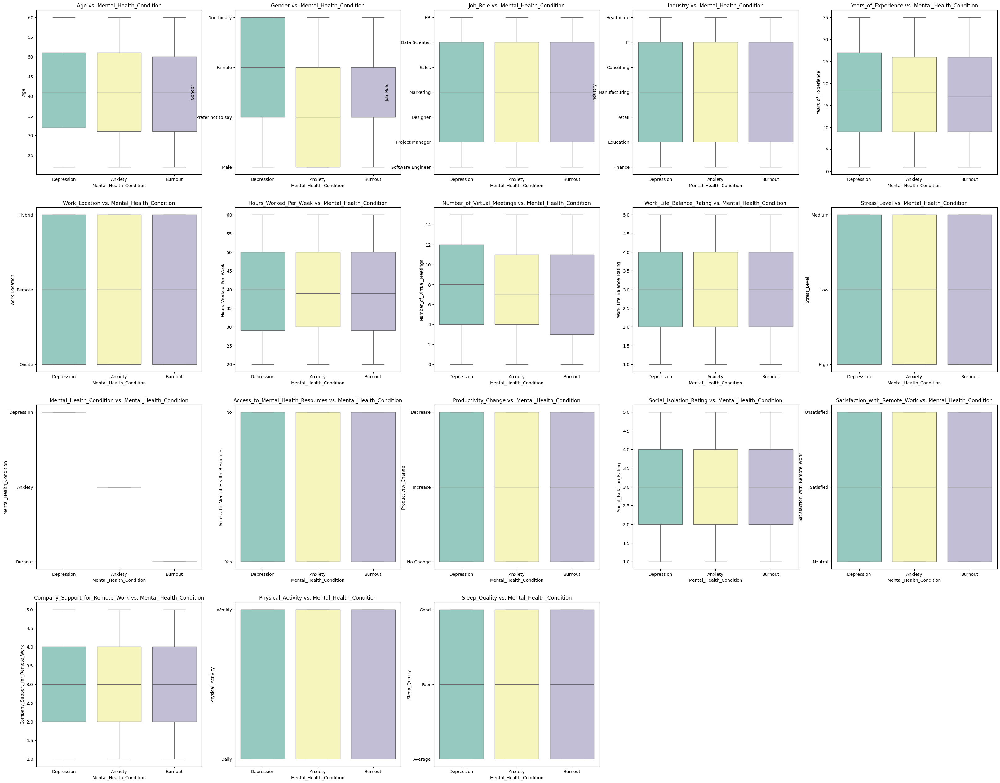

In [20]:
# Boxplots for "Mental_Health_Condition" vs. attributes

plt.figure(figsize=(40,40))
for i, col in enumerate(df_clean.columns[:-1], 1):
    plt.subplot(5, 5, i)
    sns.boxplot(x='Mental_Health_Condition', y=col, data=df_clean, hue='Mental_Health_Condition', palette='Set3', legend=False)
    plt.title(f'{col} vs. Mental_Health_Condition')
plt.show()

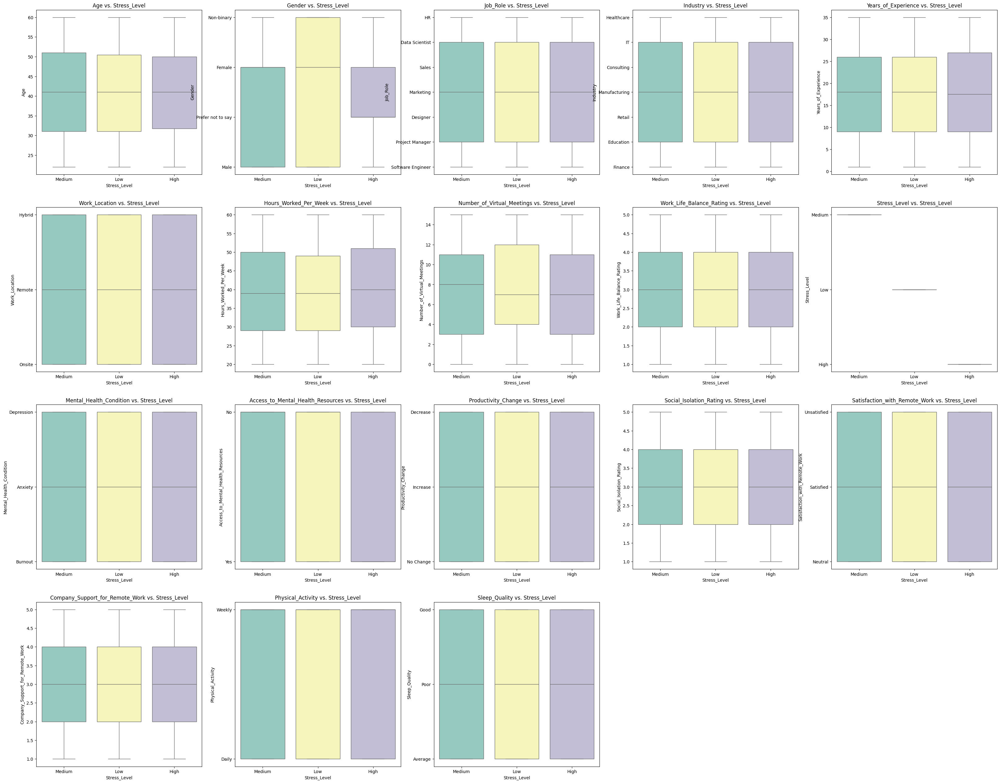

In [21]:
# Boxplots for "Stress Level" vs. attributes

plt.figure(figsize=(40,40))
for i, col in enumerate(df_clean.columns[:-1], 1):
    plt.subplot(5, 5, i)
    sns.boxplot(x='Stress_Level', y=col, data=df_clean, hue='Stress_Level', palette='Set3', legend=False)
    plt.title(f'{col} vs. Stress_Level')
plt.show()

#Visualizations Attempt Two.

In [22]:
df_clean.head()

,Age,Gender,Job_Role,Industry,Years_of_Experience,Work_Location,Hours_Worked_Per_Week,Number_of_Virtual_Meetings,Work_Life_Balance_Rating,Stress_Level,Mental_Health_Condition,Access_to_Mental_Health_Resources,Productivity_Change,Social_Isolation_Rating,Satisfaction_with_Remote_Work,Company_Support_for_Remote_Work,Physical_Activity,Sleep_Quality,Region
0,32,Non-binary,HR,Healthcare,13,Hybrid,47,7,2,Medium,Depression,No,Decrease,1,Unsatisfied,1,Weekly,Good,Europe
1,40,Female,Data Scientist,IT,3,Remote,52,4,1,Medium,Anxiety,No,Increase,3,Satisfied,2,Weekly,Good,Asia
6,31,Prefer not to say,Sales,IT,24,Remote,51,7,3,Low,Anxiety,Yes,Decrease,5,Neutral,3,Daily,Poor,Asia
9,30,Female,HR,IT,28,Hybrid,57,6,1,Low,Depression,Yes,Decrease,2,Neutral,1,Weekly,Poor,North America
12,40,Female,Marketing,Consulting,1,Remote,21,7,2,High,Depression,Yes,Decrease,2,Neutral,1,Weekly,Good,Europe


Label Encoding Mapping: {'Average': 0, 'Good': 1, 'Poor': 2}


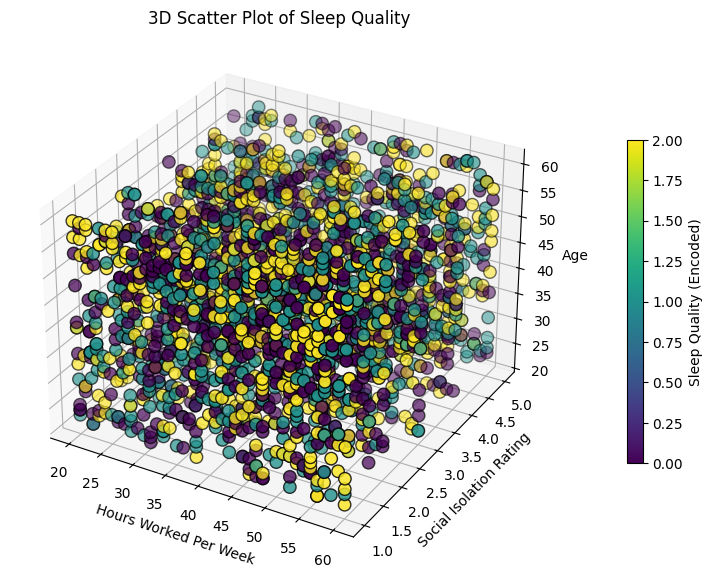

In [23]:
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D  # Import for 3D plotting

# Label Encoding Sleep Quality
le = LabelEncoder()
df_clean["Sleep_Quality_Encoded"] = le.fit_transform(df_clean["Sleep_Quality"])
print("Label Encoding Mapping:", dict(zip(le.classes_, le.transform(le.classes_))))  # Check encoding

# Create a figure and 3D axis
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with color mapping
scatter = ax.scatter(
    df_clean["Hours_Worked_Per_Week"],
    df_clean["Social_Isolation_Rating"],
    df_clean["Age"],
    c=df_clean["Sleep_Quality_Encoded"],  # Use encoded values
    cmap="viridis",  # 'coolwarm', 'plasma', etc.
    edgecolors="k",
    s=80
)

# Set labels
ax.set_xlabel("Hours Worked Per Week")
ax.set_ylabel("Social Isolation Rating")
ax.set_zlabel("Age")
ax.set_title("3D Scatter Plot of Sleep Quality")

# Fix for colorbar issue: Use fig.colorbar()
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=20, pad=0.1)
cbar.set_label("Sleep Quality (Encoded)")

# Show plot
plt.show()

Label Encoding Mapping: {'Anxiety': 0, 'Burnout': 1, 'Depression': 2}


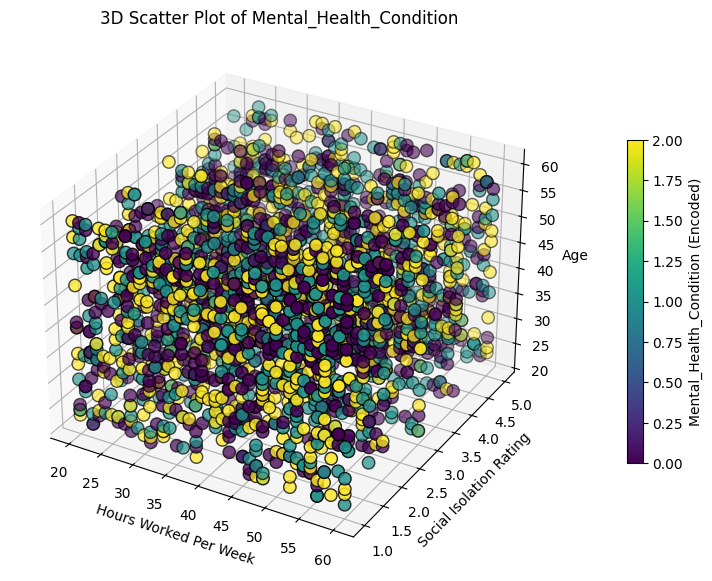

In [24]:
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D  # Import for 3D plotting

# Label Encoding Sleep Quality
le = LabelEncoder()
df_clean["Mental_Health_Condition_Encoded"] = le.fit_transform(df_clean["Mental_Health_Condition"])
print("Label Encoding Mapping:", dict(zip(le.classes_, le.transform(le.classes_))))  # Check encoding

# Create a figure and 3D axis
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with color mapping
scatter = ax.scatter(
    df_clean["Hours_Worked_Per_Week"],
    df_clean["Social_Isolation_Rating"],
    df_clean["Age"],
    c=df_clean["Mental_Health_Condition_Encoded"],  # Use encoded values
    cmap="viridis",  # 'coolwarm', 'plasma', etc.
    edgecolors="k",
    s=80
)

# Set labels
ax.set_xlabel("Hours Worked Per Week")
ax.set_ylabel("Social Isolation Rating")
ax.set_zlabel("Age")
ax.set_title("3D Scatter Plot of Mental_Health_Condition")

# Fix for colorbar issue: Use fig.colorbar()
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=20, pad=0.1)
cbar.set_label("Mental_Health_Condition (Encoded)")

# Show plot
plt.show()

Label Encoding Mapping: {'Anxiety': 0, 'Burnout': 1, 'Depression': 2}


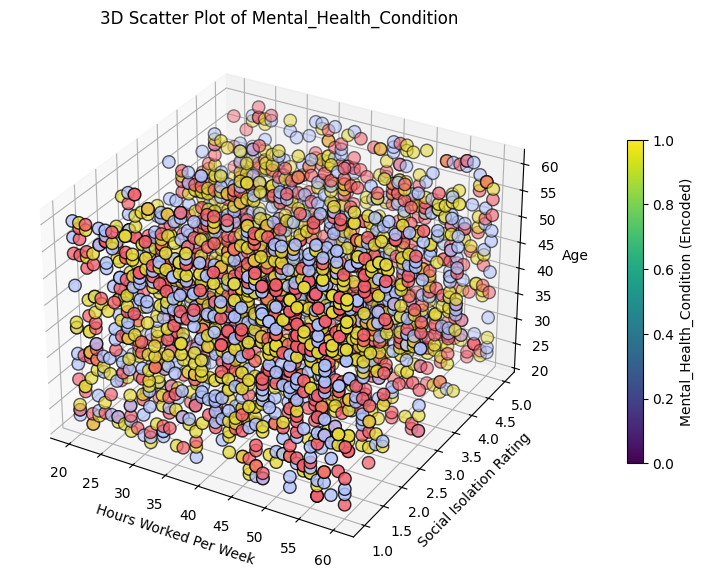

In [25]:
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D  # Import for 3D plotting

# Label Encoding Sleep Quality
le = LabelEncoder()
df_clean["Mental_Health_Condition_Encoded"] = le.fit_transform(df_clean["Mental_Health_Condition"])
print("Label Encoding Mapping:", dict(zip(le.classes_, le.transform(le.classes_))))  # Check encoding

# Create a figure and 3D axis
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Custom hex code color mapping
custom_colors = ["#B1C2FF", "#E6D939", "#F15F6C"]
encoded_values = df_clean["Mental_Health_Condition_Encoded"].unique()
color_map = {encoded_values[i]: custom_colors[i % len(custom_colors)] for i in range(len(encoded_values))}
colors = df_clean["Mental_Health_Condition_Encoded"].map(color_map)

# Scatter plot with custom colors
scatter = ax.scatter(
    df_clean["Hours_Worked_Per_Week"],
    df_clean["Social_Isolation_Rating"],
    df_clean["Age"],
    c=colors,  # Use custom colors
    edgecolors="k",
    s=80
)

# Set labels
ax.set_xlabel("Hours Worked Per Week")
ax.set_ylabel("Social Isolation Rating")
ax.set_zlabel("Age")
ax.set_title("3D Scatter Plot of Mental_Health_Condition")

# Fix for colorbar issue: Use fig.colorbar()
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=20, pad=0.1)
cbar.set_label("Mental_Health_Condition (Encoded)")

# Show plot
plt.show()